In [8]:
%%capture
#!pip install palettable
#!pip install contextily
#!pip install osmnx
#!pip install pysal
#!pip install statannot

In [9]:
import os
os.environ['USE_PYGEOS'] = '0'
import helpers as hs
from importlib import reload

--- Import helpers ---


# Descriptive data for selected neighbourhoods

## Choice of categories 

In order to analyse the city composition around POIs, we define aggregated categories of POIs, based on \textit{OpenStreetMap} build in categories :

- **Restaurants**: all types of restaurants inclunding cafes, bars, fast-foods, pubs, ice-cream shops.
- **Culture and art** : shops and amenities related to literature, music, cinema, plastic arts, performances, video games, games.
- **Education**: primary schools, middle schools, high schools, colleges, universities. 
- **Food shops** : including supermarkets as well as specialist food shops (e.g. backeries, butchers, dairy shops, seafood shops, wine shops...).
- **Fashion and beauty** : all shops related to clothes, fashion accessories (e.g. jewelleries, watches), beauty care (e.g. cosmetics, hairdresser, massage, hair removal, perfumery).
- **Supply shops** : everyday life shops apart from food shops (e.g. insurance, sport shops, furniture shops, household appliance shops ...)

In [5]:
#from helpers.scrapping import categories_tags
#for x in categories_tags : 
    #print('category : ', x)
    #print('corresponding tags : ',categories_tags[x], '\n')

## First results

In [10]:
%%capture
places = ["Gare du Nord", "Porte de la Chapelle", "Opéra Garnier", "Sacré Coeur", "Place de la Bastille", 
          "Arc de triomphe", "Olympiades", "Quartier de Javel", "Eglise du Saint-Esprit", "Place des Vosges"]
fig = hs.compare_places(places)

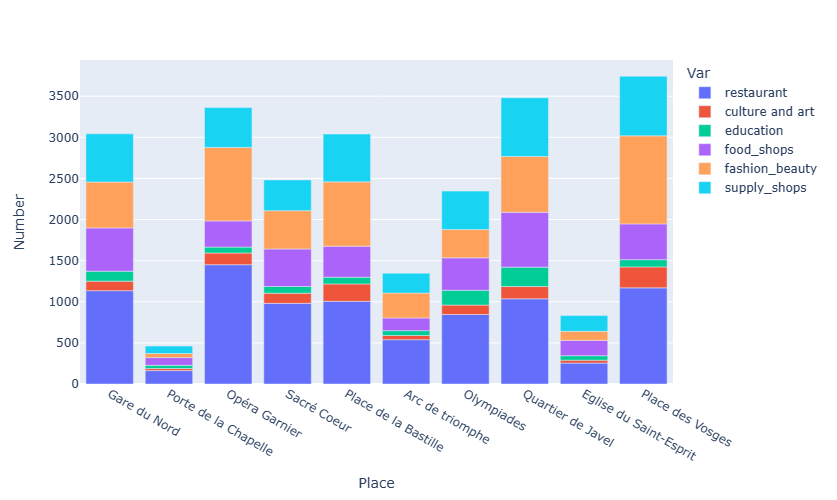

In [11]:
fig.show()

/home/onyxia/work/BATO-MOUCHE-Stat-App/helpers/scrapping.py:192: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




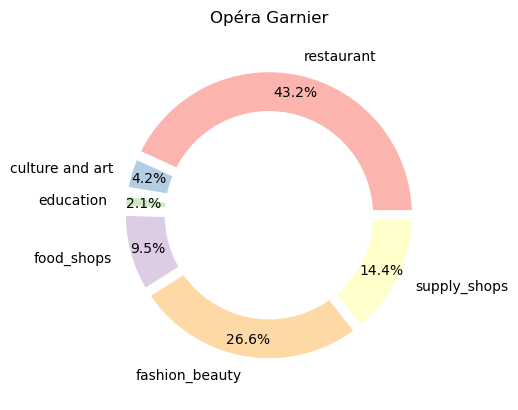

In [12]:
hs.composition_chart('Opéra Garnier')

/home/onyxia/work/BATO-MOUCHE-Stat-App/helpers/scrapping.py:192: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




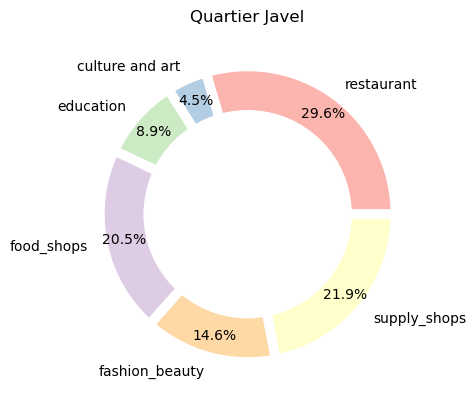

In [13]:
hs.composition_chart('Quartier Javel')

# Création de la base  de données

## Création des données aggrégées sur la grille INSPIRE 200X200m
On part des données OSM cad une liste de points avec coordonnées et infos et on veut obtenir une liste des carrés INSPIRE avec le total des catégories par carré.

In [ ]:
filosofi_file = "data/Filosofi2015_carreaux_200m_paris.gpkg"
pgdf = hs.get_POI_cat_on_INSPIRE_grid(filosofi_file)

In [ ]:
hs.folium_grid_cat_plot(pgdf,"restaurant")

### Adding variable

In [65]:
pgdf['Log'] = pgdf['Log_inc'] + pgdf['Log_av45'] + pgdf['Log_45_70'] + pgdf['Log_70_90'] + pgdf['Log_ap90'] # nombre total de logement

## Calcul des indices d'accessibilité

### two-step floating catchment area method (2SFCA)

#### Weight calcul

In [66]:
# weights can be a bit long so it's preferable to create a variable
idCol = "IdINSPIRE"
weights_by_id = hs.calculate_distanceband_weights(pgdf,idCol=idCol) 
# note it sets the idCol as index for the rest of the program to work weights_by_id and gdf needs to have the same index

/opt/mamba/lib/python3.10/site-packages/scipy/sparse/_data.py:117: RuntimeWarning: divide by zero encountered in reciprocal
  return self._with_data(data ** n)


##### Vérifions la cohérence

In [67]:
import folium

In [68]:
m=folium.Map((48.8534100,2.3488000), zoom_start=12.1)
m = pgdf[["geometry"]].assign(weight_0 = weights_by_id[pgdf.index[1]].values).explore(
    m = m,
    column = 'weight_0',
    tooltip = 'IdINSPIRE',
    tiles= "OpenStreetMap",
    popup = True,
    cmap = 'Set1',
    style_kwds = dict(color = "black",fillOpacity=0.4),
)
m

In [69]:
m=folium.Map((48.8634100,2.3588000), zoom_start=13.5)
m = pgdf[["geometry"]].assign(weight_0 = weights_by_id[pgdf.index[1]].values).explore(
    m = m,
    column = 'weight_0',
    tooltip = 'weight_0',
    tiles= "OpenStreetMap",
    popup = True,
    cmap = 'Set1',
    style_kwds = dict(color = "black",fillOpacity=0.4),
)
m

#### Calculate accessibility

In [70]:
interestVar = ['Log','Log_soc','restaurant',
       'culture and art', 'education', 'food_shops', 'fashion_beauty',
       'supply_shops']
accessibility_measures = hs.calculate_2SFCA_accessibility(pgdf,interestVar,weights_by_id)

In [71]:
for var in interestVar:
    pgdf[var+"_access"] = accessibility_measures[var]

In [72]:
hs.folium_grid_cat_plot(pgdf,"Log_soc_access")

### Aggregated accesibility (calcul grossier): 

On somme tout les calculs d'accessibilité mais le problème est que nous ne disposons pas de poids pour chaque aménité qui est calculé par la fréquence des personnes allant dans chaque lieu. Une idée simple serait de faire le rapport pour chaque aménité entre le nombre d'aménités p sur le nombre total d'aménités et donner un poids opposé à sa fréquence dans le calcul final : 
 $$ w_{p} = \frac{N_{p}}{N} $$
 
 L'idée est que moins il y a d'aménités, plus l'aménité en question est importante : il y a qu'une école alors qu'il y a 20 restaurants. Mais cela laisse de nombreux biais en surfavorisant les lieux de culture et les lieux d'éducation. 
 
 On obtiendrait ainsi pour la cellule i, le 2SFCA aggrégé : 
 $ CS_{i} = \sum_{p=1}^{P} (1 -w_{p}) \times X_{i,p} $ avec $ X_{i,p} = \frac{A_{i,p} - \min {A_{i,p}}}{\max{A_{p}} - \min{A_{p}}} $, la normalisation min-max de l'accessibilité de la cellule i à l'aménité p $A_{i,p}$. 
 
 On présentera ici un estimateur sans les poids et un autre avec. 


 
 

In [73]:
#weight calcul 
interestVar2 = ['restaurant',
       'culture and art', 'education', 'food_shops', 'fashion_beauty',
       'supply_shops']
for var in interestVar2:
        pgdf[str("weight_" + var)] = pgdf[var].sum()/(pgdf[interestVar2].sum(axis = 1).sum())

In [74]:
1 - pgdf[[str("weight_" + var) for var in interestVar2]]

,weight_restaurant,weight_culture and art,weight_education,weight_food_shops,weight_fashion_beauty,weight_supply_shops
IdINSPIRE,,,,,,
CRS3035RES200mN2893400E3763200,0.632307,0.949104,0.963908,0.841772,0.803869,0.80904
CRS3035RES200mN2890000E3762200,0.632307,0.949104,0.963908,0.841772,0.803869,0.80904
CRS3035RES200mN2893400E3762400,0.632307,0.949104,0.963908,0.841772,0.803869,0.80904
CRS3035RES200mN2891800E3763600,0.632307,0.949104,0.963908,0.841772,0.803869,0.80904
CRS3035RES200mN2890800E3763200,0.632307,0.949104,0.963908,0.841772,0.803869,0.80904
...,...,...,...,...,...,...
CRS3035RES200mN2887400E3764400,0.632307,0.949104,0.963908,0.841772,0.803869,0.80904
CRS3035RES200mN2891400E3762000,0.632307,0.949104,0.963908,0.841772,0.803869,0.80904
CRS3035RES200mN2893000E3758400,0.632307,0.949104,0.963908,0.841772,0.803869,0.80904


In [ ]:
weight_table = 1 - pgdf[[str("weight_" + var) for var in interestVar2]]
print(weight_table.iloc[[0]].to_latex())

**Commentaire :** On remarque le poids de l'éducation et le poids de la culture et des arts sont beaucoup plus forts que celui des restaurants.

$(1 -w_{p}) \times X_{i,p} $ avec $ X_{i,p} = \frac{A_{i,p} - \min {A_{i,p}}}{\max{A_{p}} - \min{A_{p}}}$

In [75]:
for var in interestVar2 : 
    pgdf[str(var + "_access" + "_norm*weight")] = (pgdf[str(var + "_access")].apply(lambda x : (x - pgdf[str(var + "_access")].min())/(pgdf[str(var + "_access")].max() - pgdf[str(var + "_access")].min())))*(1 - pgdf[str("weight_" + var)])

In [76]:
for var in interestVar2 : 
    pgdf[str(var + "_access" + "without_norm*weight")] = (pgdf[str(var + "_access")].apply(lambda x : (x - pgdf[str(var + "_access")].min())/(pgdf[str(var + "_access")].max() - 
                                                                                                                                       pgdf[str(var + "_access")].min())))

In [77]:
pgdf["CS_aggregated"] = pgdf[[i + "_access_norm*weight" for i in interestVar2]].sum(axis = 1) 

In [78]:
pgdf["CS_aggregated_without_weight"] = pgdf[[i + "_accesswithout_norm*weight" for i in interestVar2]].sum(axis = 1) 

**Without Weight**

In [ ]:
hs.folium_grid_cat_plot(pgdf,"CS_aggregated_without_weight")

**With weights**

In [ ]:
hs.folium_grid_cat_plot(pgdf,"CS_aggregated")

**Commentaire :** On remarque dans les deux cas un gradient en cercle concentrique dans l'accès aux aménités aggrégé partant de trois pôles principaux : le quartier Opéra, les Halles et le quartier Latin. Confirmant ainsi les statistiques descriptives sur le quartier de l'Opéra. Pour le Quartier Latin, cela s'explique par la forte présence à la fois de musées, d'établissements universitaire/secondaires. Le quartier des Halles s'explique par le centre commercial. On remarque que lorsqu'on rajoute des poids certains carrés affiche un score d'accès plus important comme à Passy dans le XVIème arrondissment. Cela s'explique par les caractéristiques de cet arrondissement : majoritairement composé de personnes agées favorisées, il présente un nombre important d'établissements scolaires dans lequel sont scolarisés de nombreux enfants ne venant pas du quartier  (Saint-Jean de Passy, Franklin, Janson, de la Tour,etc... au total 13 lycées) 

# Analyses

## Régression

"L’autocorrélation spatiale a deux sources principales :
- elle peut provenir du fait que les données sont affectées par des processus qui relient des lieux différents et qui sont à l’origine d’une organisation spatiale particulière des activités. En effet, les processus d’interactions sont source d’autocorrélation spatiale lorsque les événements ou les circonstances en un lieu donné affectent les conditions en d’autres lieux si ces derniers interagissent d’une manière ou d’une autre, par des mouvements de biens, de personnes, de capitaux, des externalités spatiales ou toutes les formes de comportements où un acteur économique réagit aux actions d’autres acteurs. Par exemple, la diffusion d’un phénomène (comme la diffusion technologique) à partir d’un ou de plusieurs lieux d’origine implique que l’intensité de la mesure de ce phénomène dépend de la distance à l’origine. Aux localisations proches les unes des autres, donc à des distances comparables de l’origine, seront donc associées des intensités similaires pour le phénomène étudié ;
- elle peut également provenir d’une mauvaise spécification du modèle, comme des variables omises spatialement autocorrélées, d’une forme fonctionnelle incorrecte ou d’erreurs de mesure (c’est en particulier le cas lorsque l’étendue spatiale du phénomène étudié ne coïncide pas avec les unités spatiales d’observation). Elle est alors considérée comme un outil de diagnostic et de détection d’une mauvaise spécification du modèle." 

(source : https://www.cairn.info/revue-economie-et-prevision-2002-4-page-139.htm)

### Spatial Weight 
Choix d'un poids continu au format Queen suivant l'indice de Moran (à vérifier). 



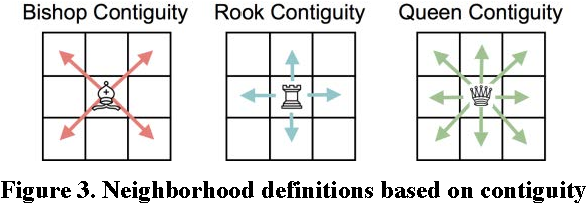

In [79]:
from pysal.lib import weights
w_queen = weights.contiguity.Queen.from_dataframe(pgdf) # adjacent in all directions, including diagonal.
# Replace Queen by rook for only up/down/left/right adjancy
w_queen.transform = 'r'


('WARNING: ', 196, ' is an island (no neighbors)')
('WARNING: ', 231, ' is an island (no neighbors)')
('WARNING: ', 744, ' is an island (no neighbors)')
('WARNING: ', 780, ' is an island (no neighbors)')
('WARNING: ', 813, ' is an island (no neighbors)')
('WARNING: ', 823, ' is an island (no neighbors)')
('WARNING: ', 836, ' is an island (no neighbors)')
('WARNING: ', 841, ' is an island (no neighbors)')
('WARNING: ', 862, ' is an island (no neighbors)')
('WARNING: ', 1019, ' is an island (no neighbors)')
('WARNING: ', 1020, ' is an island (no neighbors)')
('WARNING: ', 1060, ' is an island (no neighbors)')
('WARNING: ', 1063, ' is an island (no neighbors)')
('WARNING: ', 1071, ' is an island (no neighbors)')
('WARNING: ', 1100, ' is an island (no neighbors)')
('WARNING: ', 1259, ' is an island (no neighbors)')
('WARNING: ', 1349, ' is an island (no neighbors)')
('WARNING: ', 1404, ' is an island (no neighbors)')
('WARNING: ', 1601, ' is an island (no neighbors)')
('WARNING: ', 1681, '

/opt/mamba/lib/python3.10/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 33 disconnected components.
 There are 26 islands with ids: 196, 231, 744, 780, 813, 823, 836, 841, 862, 1019, 1020, 1060, 1063, 1071, 1100, 1259, 1349, 1404, 1601, 1681, 1754, 1766, 1769, 1779, 1781, 1788.
  warnings.warn(message)


In [80]:
from pysal.explore import esda
moran = esda.moran.Moran(pgdf["CS_aggregated"], w_queen)
print("Moran's I", moran.I,"Moran's simulated p-value",moran.p_sim)

Moran's I 0.9492700383790345 Moran's simulated p-value 0.001


/opt/mamba/lib/python3.10/site-packages/pointpats/geometry.py:44: DeprecationWarning: Please use `ConvexHull` from the `scipy.spatial` namespace, the `scipy.spatial.qhull` namespace is deprecated.
  def _(shape: spatial.qhull.ConvexHull):
/opt/mamba/lib/python3.10/site-packages/pointpats/geometry.py:87: DeprecationWarning: Please use `ConvexHull` from the `scipy.spatial` namespace, the `scipy.spatial.qhull` namespace is deprecated.
  def _(shape: spatial.qhull.ConvexHull):
/opt/mamba/lib/python3.10/site-packages/pointpats/geometry.py:134: DeprecationWarning: Please use `ConvexHull` from the `scipy.spatial` namespace, the `scipy.spatial.qhull` namespace is deprecated.
  def _(shape: spatial.qhull.ConvexHull, x: float, y: float):
/opt/mamba/lib/python3.10/site-packages/pointpats/geometry.py:176: DeprecationWarning: Please use `ConvexHull` from the `scipy.spatial` namespace, the `scipy.spatial.qhull` namespace is deprecated.
  def _(shape: spatial.qhull.ConvexHull):
/opt/mamba/lib/python3

### Spatial Regression

L'autocorrélation spatiale désigne le fait que les variables ne sont pas réparties de manières idd dans l'espace. Il existe trois modèles principaux.

**Spatial error Model (SEM):** Ce modèle introduit un spatial lag dans le terme d'erreur. 

$$ Y_{i} = \alpha +  X_{i}\beta  + u_{i} $$
$$ u_{i}= \lambda u_{lag - i} + \epsilon_{i}$$

Avec $u_{lag - i} = \sum_{j}w_{i,j}u{j} $. Le paramètre $\lambda$ représente l'intensité de l'interdépendance entre les termes d'erreurs $u$.

**Spatial lag Model '(SAR):** Ce modèle introduit un spatial lag dans les variables dépendantes. 

$$ Y_{i} = \alpha +  \rho W Y_{lag - i}+ X\beta  + \epsilon_{i} $$

Regarde l'interdépendance spatiale avec les autres variables. On calcule l'endegenous lag en faisant une régression TWO-SLS avec pour instrument de l'endegenous lag, le spatial lag de toutes les variables explicatives. 

**SARMA:** Ce modèle dit SARMA combine les deux précèdentes approches. 

$$ Y = X\beta +  \rho W Y + \lambda u + \epsilon $$


### Préparation des données 

L'idée est de recréer les mêmes variables que l'article d'Utretch dans la mesure du possible : 
- % de foyer vivant en dessous du seuil minimum social (%_soc.minimum)
- % d'individus ayant plus de 65 ans (%_>_65)
- % d'individus ayant moins de 17 ans (%_<_17)
- % de logements construits avant 1945 (%_<_bat_45)
- % de logements construits après 1990 (%_>_bat_90)
- % de résidences collectives  (%_residences)
- La moyenne du revenu annuel par personne (mean_income)
- La densité par km^2 (density)

Nous ne disposons pas du pourcentage de personnes recevant les indémnités chômages ou les allocations RSA, ni du pourcentage de migrants, ni de la distance au transport le plus proche pour le moment. 

In [ ]:
pgdf["%_soc.minimum"] = (pgdf["Men_pauv"]/pgdf["Ind"])*100
pgdf["%_>_65"] = ((pgdf["Ind_65_79"] +pgdf["Ind_80p"])/pgdf["Ind"])*100
pgdf["%_<_17"] = ((pgdf["Ind_0_3"] +pgdf["Ind_4_5"] + pgdf["Ind_6_10"] + pgdf["Ind_11_17"])/pgdf["Ind"])*100
pgdf["%_<_bat_45"] = (pgdf["Log_av45"]/(pgdf["Log_av45"] +pgdf["Log_45_70"] + pgdf["Log_70_90"] + pgdf["Log_ap90"] + pgdf["Log_inc"]))*100
pgdf["%_>_bat_90"] = (pgdf["Log_ap90"]/(pgdf["Log_av45"] +pgdf["Log_45_70"] + pgdf["Log_70_90"] + pgdf["Log_ap90"] + pgdf["Log_inc"]))*100
pgdf["%_residences"] = (pgdf["Men_coll"]/(pgdf["Men_coll"] +pgdf["Men_mais"]))*100
pgdf["mean_income"] = pgdf["Ind_snv"]/pgdf["Ind"]
pgdf["density"] = pgdf["Ind"]/(0.0002)

In [ ]:
from pysal.lib import weights

### Lagrange Multiplier tests to choose regression 

In [ ]:
w_queen = weights.contiguity.Queen.from_dataframe(pgdf) # adjacent in all directions, including diagonal.
# Replace Queen by rook for only up/down/left/right adjancy

In [ ]:
 w_queen.transform = 'r'

In [ ]:
from pysal.model import spreg

In [ ]:
from spreg import OLS
dep_var = 'culture and art_access'
independ_var = ["%_soc.minimum", "%_>_65", "%_<_17", "%_<_bat_45", "%_>_bat_90", "%_residences", "mean_income","density"]
ols = OLS(pgdf[[dep_var]].values, pgdf[independ_var].values)

In [ ]:
def LM_test(df,dep_var, indep_var, w) : 
    ols = OLS(df[[dep_var]].values, df[independ_var].values)
    lms = spreg.LMtests(ols, w)
    print("LM error test p_value for " + str(dep_var) + " : " + str(round(lms.lme[1],4)))
    print("LM lag test p_value for " + str(dep_var) + " : " + str(round(lms.lml[1],4)))
    print("Robust LM error test p_value for " + str(dep_var) + " : " + str(round(lms.rlme[1],4)))
    print("Robust LM lag test p_value for " + str(dep_var) + " : " + str(round(lms.rlml[1],4)))
    print("LM SARMA test p_value for " + str(dep_var) + " : " + str(round(lms.sarma[1],4)))

### Spatial regression 
 
 Two models: 
 
 Model A : 
- %_soc.minimum
- %_>_65
- %_<_17

Model B : 
- %_soc.minimum
- %_>_65
- %_<_17
- %_<_bat_45
- %_>_bat_90
- %_residences
- mean_income
- density

In [ ]:
independ_var_A = ["%_soc.minimum", "%_>_65", "%_<_17"]
independ_var_B = ["%_soc.minimum", "%_>_65", "%_<_17", "%_<_bat_45", "%_>_bat_90", "%_residences", "mean_income","density"]

In [ ]:
def reg_spatial(dep_var, independ_var): 
    m2 = spreg.GM_Combo(
    # Dependent variable
    pgdf[[dep_var]].values,
    pgdf[independ_var].values,
    w=w_queen,
    name_y=dep_var,
    name_x= independ_var,
) #SARAR Model

    return m2


#### restaurant_access

In [ ]:
dep_var = 'restaurant_access'

Modèle A

In [ ]:
LM_test(pgdf, dep_var, independ_var_A, w = w_queen)

In [ ]:
print(reg_spatial(dep_var, independ_var_A).summary)

Modèle B

In [ ]:
LM_test(pgdf, dep_var, independ_var_B, w = w_queen)

In [ ]:
print(reg_spatial(dep_var, independ_var_B).summary)

#### culture and art_access

In [ ]:
dep_var = 'culture and art_access'

Modèle A 

In [ ]:
LM_test(pgdf, dep_var, independ_var_A, w = w_queen)

In [ ]:
print(reg_spatial(dep_var, independ_var_A).summary)

Modèle B

In [ ]:
LM_test(pgdf, dep_var, independ_var_B, w = w_queen)

In [ ]:
print(reg_spatial(dep_var, independ_var_B).summary)

#### education_access

In [ ]:
dep_var = 'education_access'

Modèle A

In [ ]:
LM_test(pgdf, dep_var, independ_var_A, w = w_queen)

In [ ]:
print(reg_spatial(dep_var, independ_var_A).summary)

Modèle B

In [ ]:
LM_test(pgdf, dep_var, independ_var_B, w = w_queen)

In [ ]:
print(reg_spatial(dep_var, independ_var_B).summary)

#### food_shops_access

In [ ]:
dep_var = 'food_shops_access'

Modèle A

In [ ]:
LM_test(pgdf, dep_var, independ_var_A, w = w_queen)
print(reg_spatial(dep_var, independ_var_A).summary)

Modèle B 

In [ ]:
LM_test(pgdf, dep_var, independ_var_B, w = w_queen)
print(reg_spatial(dep_var, independ_var_B).summary)

#### fashion_beauty_access

In [ ]:
dep_var = 'fashion_beauty_access'

Modèle A

In [ ]:
LM_test(pgdf, dep_var, independ_var_A, w = w_queen)
print(reg_spatial(dep_var, independ_var_A).summary)

Modèle B

In [ ]:
LM_test(pgdf, dep_var, independ_var_B, w = w_queen)
print(reg_spatial(dep_var, independ_var_B).summary)

#### supply_shops_access

In [ ]:
dep_var = 'supply_shops_access'

Modèle A

In [ ]:
LM_test(pgdf, dep_var, independ_var_A, w = w_queen)
print(reg_spatial(dep_var, independ_var_A).summary)

Modèle B 

In [ ]:
LM_test(pgdf, dep_var, independ_var_B, w = w_queen)
print(reg_spatial(dep_var, independ_var_B).summary)

#### Aggregated CS

In [ ]:
dep_var = 'CS_aggregated'

Modèle A 

In [89]:
LM_test(pgdf, dep_var, independ_var_A, w = w_queen)

mA = reg_spatial(dep_var, independ_var_A)
print(reg_spatial(dep_var, independ_var_A).summary)

LM error test p_value for CS_aggregated : 0.0
LM lag test p_value for CS_aggregated : 0.0
Robust LM error test p_value for CS_aggregated : 0.0
Robust LM lag test p_value for CS_aggregated : 0.0
LM SARMA test p_value for CS_aggregated : 0.0
REGRESSION
----------
SUMMARY OF OUTPUT: SPATIALLY WEIGHTED TWO STAGE LEAST SQUARES
-------------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :CS_aggregated                Number of Observations:        1977
Mean dependent var  :      0.9592                Number of Variables   :           5
S.D. dependent var  :      0.5454                Degrees of Freedom    :        1972
Pseudo R-squared    :      0.9859
Spatial Pseudo R-squared:  0.3708

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
---------------------------------------------------

In [106]:
print(mA.summary.as_latex())

AttributeError: 'str' object has no attribute 'as_latex'

**Commentaire:** Seule la variable %_soc.minimum n'est pas significatif. On remarque une corrélation négative entre le % de personnes ayant plus de 65 et le % de personnes ayant moins de 17 ans. On retrouve ainsi les mêmes résultats que dans l'article d'Utrecht. Ils expliquent la corrélation négative par le fait que les familles préfèrent vivre dans les zones résidentielles que dans les villes mais ici cela ne fonctionne pas tellement. 

Modèle B 

In [ ]:
LM_test(pgdf, dep_var, independ_var_B, w = w_queen)
print(reg_spatial(dep_var, independ_var_B).summary)

**Commentaire :** Les variables %_>_bat_90 et mean_income ne sont pas significatives (logique pour les bâtiments à Paris - il n'y a pas de nouveaux quartiers)


## Clusterisation

### Exclusion des isolats et sélection des variables

In [ ]:
bois = ["CRS3035RES200mN2891600E3754800","CRS3035RES200mN2891600E3754400","CRS3035RES200mN2891800E3754000","CRS3035RES200mN2892000E3753800",
        "CRS3035RES200mN2891800E3753200","CRS3035RES200mN2891400E3753200","CRS3035RES200mN2891600E3752000","CRS3035RES200mN2891400E3752400",
        "CRS3035RES200mN2891200E3751800","CRS3035RES200mN2891000E3752200","CRS3035RES200mN2890600E3752000","CRS3035RES200mN2890000E3751400",
        "CRS3035RES200mN2890200E3752600","CRS3035RES200mN2889400E3752600","CRS3035RES200mN2890600E3753600","CRS3035RES200mN2890000E3753200",
        "CRS3035RES200mN2889800E3753600","CRS3035RES200mN2890400E3754000","CRS3035RES200mN2890200E3754000","CRS3035RES200mN2893000E3764400",
        "CRS3035RES200mN2887000E3754400","CRS3035RES200mN2887000E3754600","CRS3035RES200mN2887200E3754800","CRS3035RES200mN2887400E3754800",
        "CRS3035RES200mN2885600E3762800","CRS3035RES200mN2885600E3764600","CRS3035RES200mN2886200E3765200","CRS3035RES200mN2886400E3765400",
        "CRS3035RES200mN2885600E3765400","CRS3035RES200mN2886000E3765800","CRS3035RES200mN2886400E3766200","CRS3035RES200mN2886600E3766400",
        "CRS3035RES200mN2886400E3766800","CRS3035RES200mN2886600E3766800","CRS3035RES200mN2886600E3767000","CRS3035RES200mN2886600E3767200",
        "CRS3035RES200mN2886400E3767600","CRS3035RES200mN2886400E3768000","CRS3035RES200mN2886600E3768200","CRS3035RES200mN2886000E3767000",
        "CRS3035RES200mN2886000E3767600","CRS3035RES200mN2885600E3768000","CRS3035RES200mN2885000E3767000","CRS3035RES200mN2885000E3767400",
        "CRS3035RES200mN2885000E3768200","CRS3035RES200mN2884600E3768200","CRS3035RES200mN2884400E3768000"]

In [ ]:
clusterVar = [var+"_access" for var in interestVar]
X = pgdf[clusterVar]
X = X.drop(bois)
inmur = pgdf.drop(bois)

### KMeans
MiniBatchKMeans works better because we don't have that many samples

In [ ]:
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer

mat = X.values

pipe = Pipeline(steps=[('preprocessor', StandardScaler),
                      ('clustering', MiniBatchKMeans)])
scaler = pipe['preprocessor']()
scaler.fit(X=mat)
mat = scaler.transform(mat)

km = pipe['clustering'](n_clusters = 5, random_state =1)

visualizer = KElbowVisualizer(km, k=(2,12))
visualizer.fit(mat)



In [ ]:
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

mat = X.values

pipe = Pipeline(steps=[('preprocessor', StandardScaler),
                      ('clustering', MiniBatchKMeans)])
scaler = pipe['preprocessor']()
scaler.fit(X=mat)
mat = scaler.transform(mat)

km = pipe['clustering'](n_clusters = 5, random_state =1)
#km = KMeans(n_clusters=5)
km.fit(mat)
labels = km.labels_
inmur["label"] = labels



### MeanShift
Doesn't work well even with exclusion of the park and standartisation with only accessibility

In [ ]:
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

mat = X.values

pipe = Pipeline(steps=[('preprocessor', StandardScaler),
                      ('clustering', MeanShift)])

scaler = pipe['preprocessor']()
scaler.fit(X=mat)
mat = scaler.transform(mat)

bandwidth = estimate_bandwidth(mat, quantile=0.2, n_samples=500)
ms = pipe['clustering'](bandwidth=bandwidth, bin_seeding=True)
#km = KMeans(n_clusters=5)
ms.fit(mat)
labels = ms.labels_
inmur["label"] = labels



### Visualisation

In [ ]:
hs.folium_grid_cat_plot(inmur,'label')

# Analyse en grandes dimensions

In [ ]:
filosofi_file = "data/Filosofi2015_carreaux_200m_paris.gpkg"
pgdf = hs.get_POI_cat_on_INSPIRE_grid(filosofi_file,city = "Paris", reduced_cat= False)

In [ ]:
# weights can be a bit long so it's preferable to create a variable
idCol = "IdINSPIRE"
weights_by_id = hs.calculate_distanceband_weights(pgdf,idCol=idCol) 
# note it sets the idCol as index for the rest of the program to work weights_by_id and gdf needs to have the same index

In [ ]:
interestVar = ['Log','Log_soc','restaurant',
       'culture and art', 'education', 'food_shops', 'fashion_beauty',
       'supply_shops']
accessibility_measures = hs.calculate_2SFCA_accessibility(pgdf,interestVar,weights_by_id)

In [ ]:
for var in interestVar:
    pgdf[var+"_access"] = accessibility_measures[var]